**Amplitude Modulation with Audio Signal from wav File + Demodulation**

20778 -24575


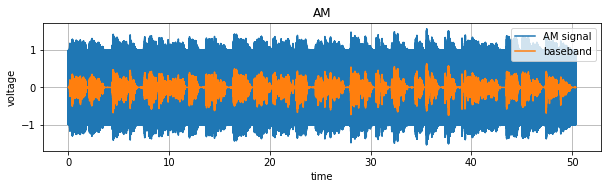

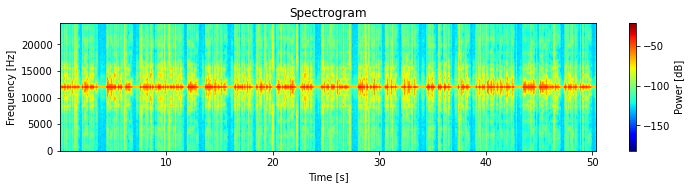

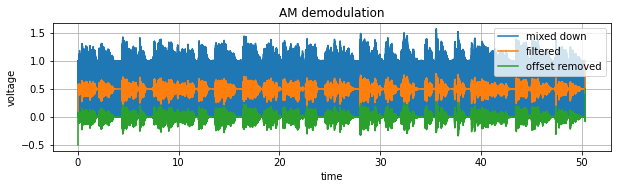

Original Signal


Demodulated Signal


In [10]:
# Amplitude Modulation (AM) demodulation
import numpy as np
import scipy.signal as sp
import scipy.signal as signal
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from IPython.display import Audio

plt.rcParams['legend.loc'] = 'upper right' # speed up plotting for large amount of data

# Read the WAV file: baseband
input_filename = "sample_audio.wav"
fs, uaudio = read(input_filename)
print(np.max(uaudio), np.min(uaudio))
Ts = 1 / fs  # time step
Tmax = len(uaudio)/fs
t = np.arange(0, Tmax, Ts)  # time vector start / step / end

scale = (2**16)/2-1 # 16 bit resolution
uaudio_scaled = uaudio/scale

# carrier
fc = 12000
uc = np.sin(2 * np.pi * fc * t)

# AM
m = 0.9
uam = uc * (1 + m * uaudio_scaled)  # 1 = DC offset
 
# Plot Time Domain
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 1) 
plt.plot(t, uam, t, uaudio_scaled)
plt.grid(True)
plt.title('AM')
plt.xlabel('time')
plt.ylabel('voltage')
plt.legend(['AM signal', 'baseband'])

# Plot the spectrogram
#frequencies, times, Sxx = spectrogram(uam, fs=fs, nperseg=1024)
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 2)
plt.specgram(uam, Fs=fs, NFFT=1024, cmap='jet')
plt.xlabel("Time [s]")
plt.ylabel("Frequency [Hz]")
plt.title("Spectrogram")
plt.colorbar(label="Power [dB]")

# Demodulation
# Down mixing
udownmix = uam * uc

# Low pass filter
fc = 5000   # Cutoff frequency in Hz
order = 5   # Filter order

# Design Butterworth low-pass filter
b, a = signal.butter(order, fc / (fs / 2), btype='low', analog=False)
# Apply the filter
udemod = signal.filtfilt(b, a, udownmix)

# Offset removed
ub = udemod - np.mean(udemod)

# Plot Time Domain
plt.figure(figsize=(10, 8))
plt.subplot(3, 1, 3) 
plt.plot(t, udownmix, t, udemod, t, ub)
plt.grid(True)
plt.title('AM demodulation')
plt.xlabel('time')
plt.ylabel('voltage')
plt.legend(['mixed down', 'filtered', 'offset removed'])
plt.show()


# Play original audio
audio1 = Audio(data=uaudio_scaled, rate=fs)
# Play demodulated audio
audio2 = Audio(data=ub, rate=fs)

print("Original Signal")
display(audio1)
print("Demodulated Signal")
display(audio2)

